### Final annotation of Myeloid cells


Preprocessing:
- Myeloid cells from main object subsetted
- performed scvi batch correction to prepare objects with cell cycle gene regression

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/post_scvi20221124/Myeloid.hvg5000_noCC.scvi_output.with_annotv2_v3.22021124.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 37393 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

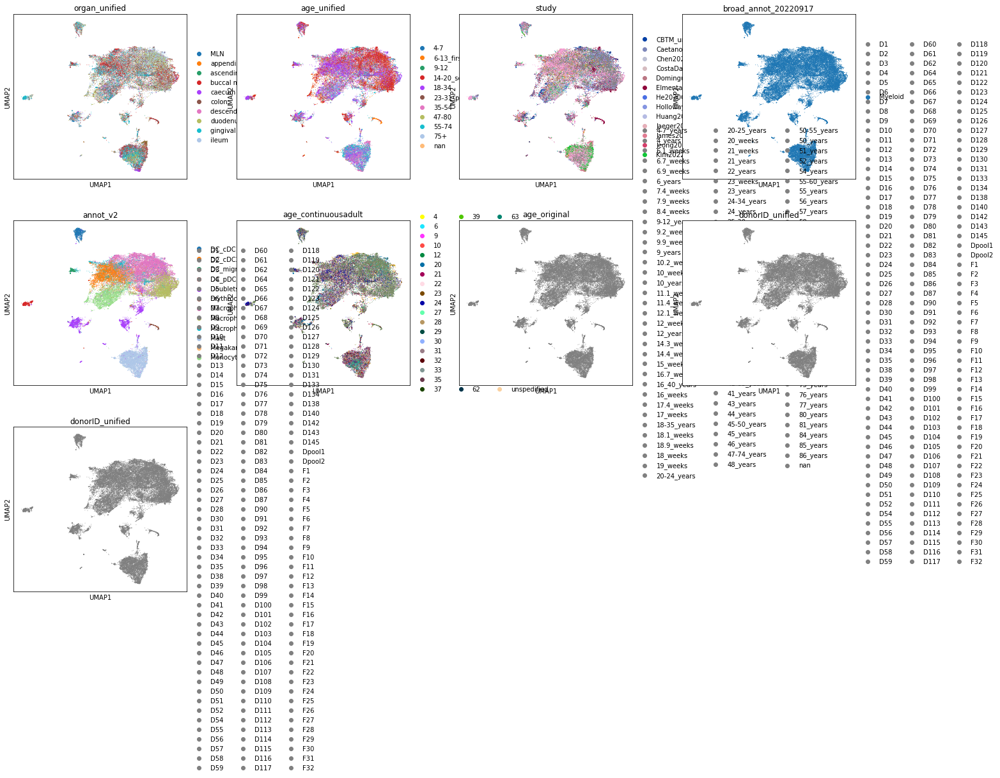

In [4]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata, color=['organ_unified', 'age_unified','study','broad_annot_20220917','annot_v2','age_continuousadult','age_original','donorID_unified','donorID_unified'],cmap='OrRd')

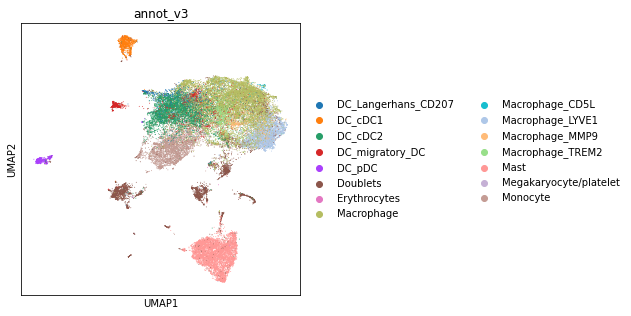

In [5]:
sc.pl.umap(adata,color='annot_v3')

In [6]:
adata.X.max()

13567.0

In [7]:
#save raw counts in layers
adata.layers['counts'] = adata.X
#normalise and transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

In [8]:
adata.X.max()

8.858953

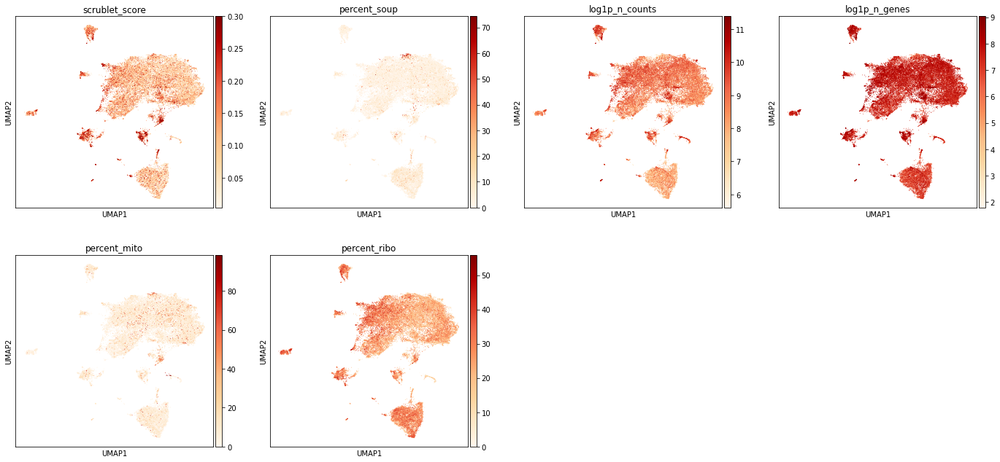

In [9]:
#plot some basic QC
sc.pl.umap(adata, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

In [10]:
sc.tl.leiden(adata, resolution = 1, neighbors_key="neighbors_scvi")

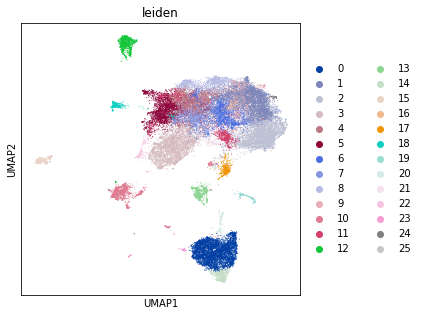

In [11]:
sc.pl.umap(adata,color=['leiden'])

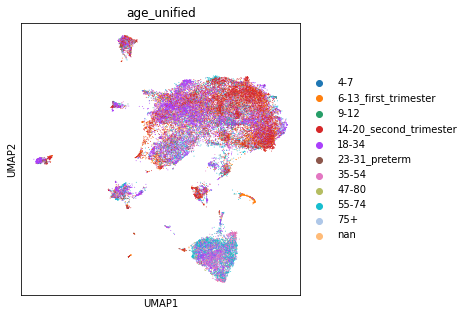

In [16]:
sc.pl.umap(adata,color='age_unified')

In [13]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *

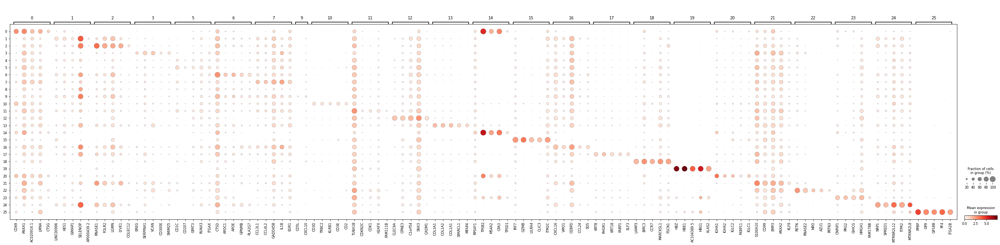

In [14]:
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='leiden', mks=mks)

In [32]:
new = adata[adata.obs.leiden.isin(['20','23','10','22','19'])]

In [33]:
new.obs['annot_v3'] = (
    new.obs["leiden"]
    .map(lambda x: {'10':'Doublets','20':'Doublets','23':'Eosinophil/basophil','22':'Mono/neutrophil_MPO',
                    '19':'Erythrocytes'
    }.get(x, x))
    .astype("category")
)

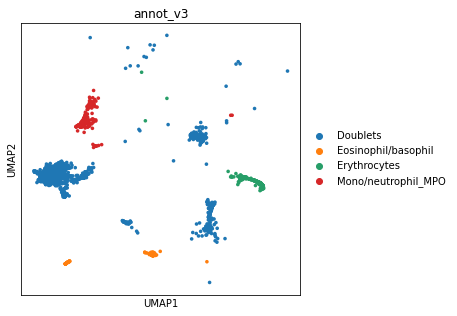

In [34]:
sc.pl.umap(new,color='annot_v3')

In [19]:
eb = new[new.obs.annot_v3.isin(['Eosinophil/basophil'])].copy()

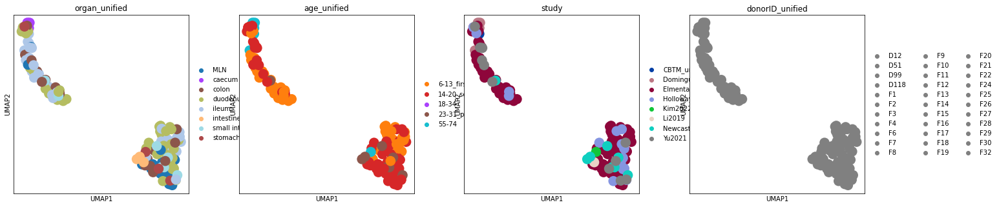

In [20]:
sc.pp.neighbors(
        eb,
            use_rep="X_scvi",
            n_pcs=eb.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(eb, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(eb, color=['organ_unified', 'age_unified','study','donorID_unified'])

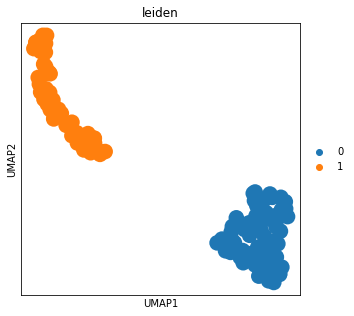

In [21]:
sc.tl.leiden(eb, resolution = 0.2, neighbors_key="neighbors_scvi")
sc.pl.umap(eb, color=['leiden'])

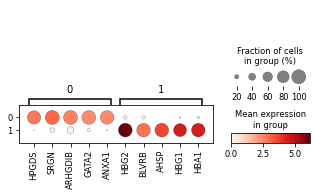

In [22]:
eb.raw = eb.copy()
mkst = calc_marker_stats(eb, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(eb, groupby='leiden', mks=mks)

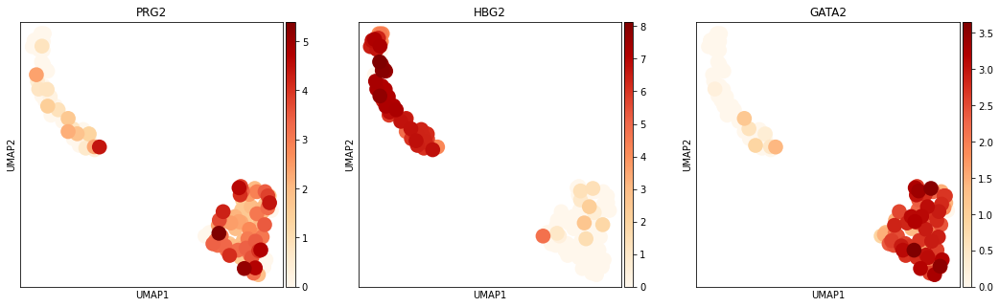

In [25]:
sc.pl.umap(eb,color=['PRG2','HBG2','GATA2'],cmap='OrRd')

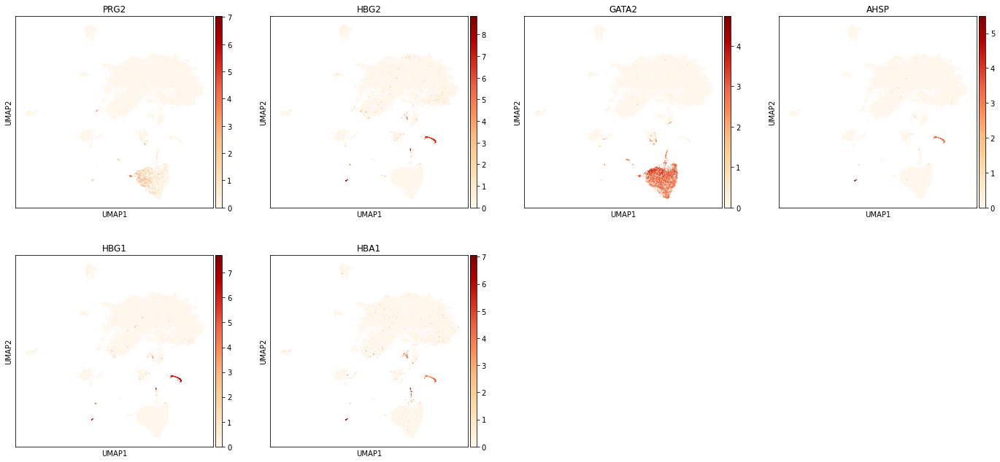

In [29]:
sc.pl.umap(adata,color=['PRG2','HBG2','GATA2','AHSP','HBG1','HBA1'],cmap='OrRd')

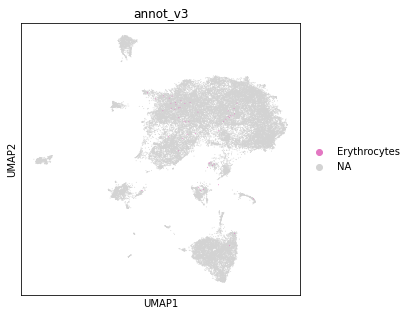

In [27]:
sc.pl.umap(adata,color='annot_v3',groups='Erythrocytes')

In [36]:
new_cluster_names = [
    'Eosinophil/basophil','Doublets' #0,1
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

eb.obs['annot_v3'] = [conv[x] for x in eb.obs['leiden']]

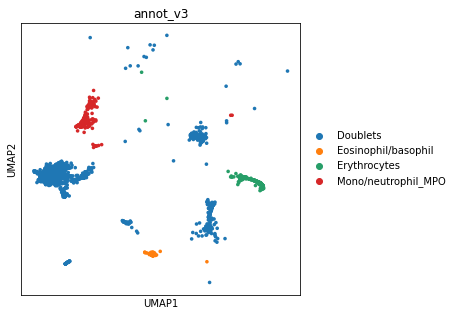

In [37]:
ON = {O:N for O,N in zip(eb.obs_names,eb.obs["annot_v3"])}
new.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(new.obs_names, new.obs["annot_v3"])]
sc.pl.umap(new,color='annot_v3')

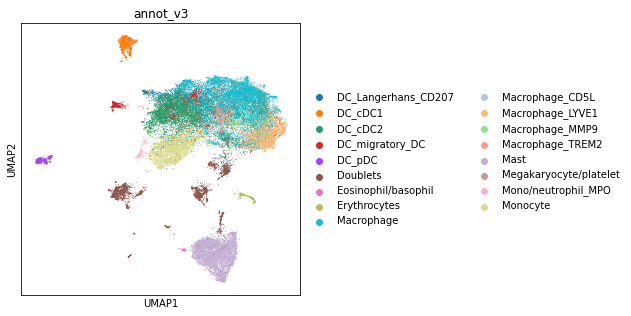

In [38]:
ON = {O:N for O,N in zip(new.obs_names,new.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

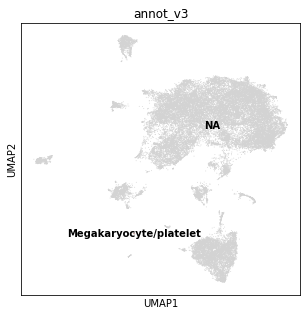

In [40]:
sc.pl.umap(adata,color='annot_v3',groups='Megakaryocyte/platelet',legend_loc='on data')

macrophage clusters are a bit messy after scvi redo - see if they cluster nicer when subclustering

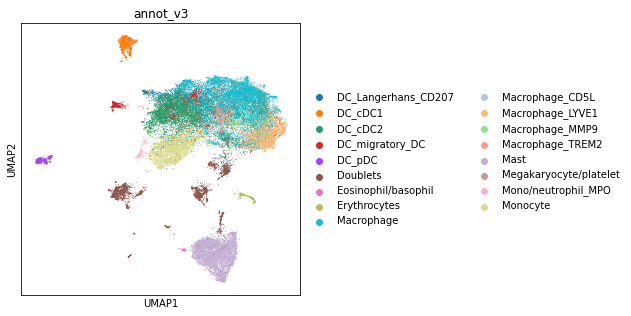

In [41]:
sc.pl.umap(adata,color='annot_v3')

In [42]:
list(adata.obs.annot_v3.unique())

['Mast',
 'DC_cDC1',
 'Monocyte',
 'DC_cDC2',
 'Macrophage',
 'DC_migratory_DC',
 'Macrophage_MMP9',
 'Macrophage_TREM2',
 'DC_pDC',
 'Doublets',
 'DC_Langerhans_CD207',
 'Macrophage_LYVE1',
 'Megakaryocyte/platelet',
 'Mono/neutrophil_MPO',
 'Macrophage_CD5L',
 'Erythrocytes',
 'Eosinophil/basophil']

In [44]:
macro = adata[adata.obs.annot_v3.isin([
 'DC_cDC2',
 'Macrophage',
 'DC_migratory_DC',
 'Macrophage_MMP9',
 'Macrophage_TREM2',
 'DC_Langerhans_CD207',
 'Macrophage_LYVE1',
 'Macrophage_CD5L'])].copy()

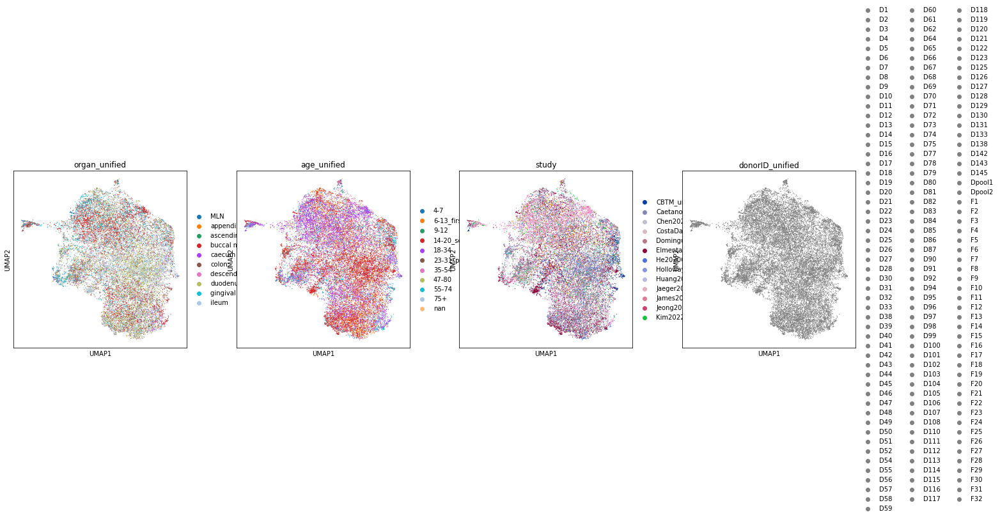

In [45]:
sc.pp.neighbors(
        macro,
            use_rep="X_scvi",
            n_pcs=macro.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(macro, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(macro, color=['organ_unified', 'age_unified','study','donorID_unified'])

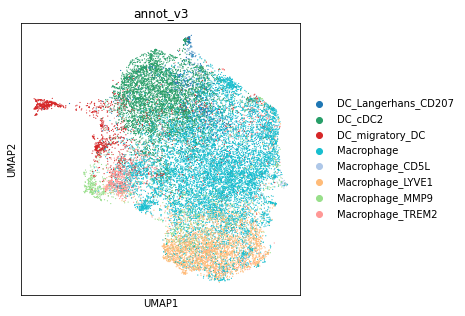

In [46]:
sc.pl.umap(macro,color='annot_v3')

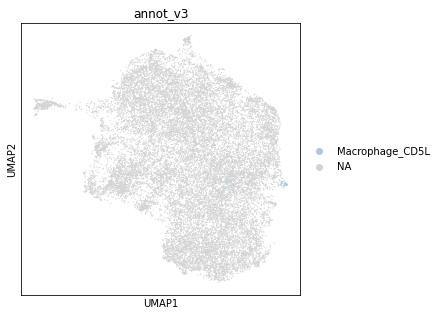

In [47]:
sc.pl.umap(macro,color='annot_v3',groups='Macrophage_CD5L')

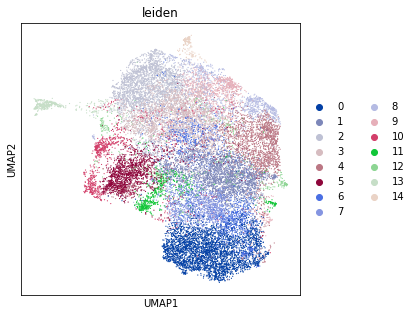

In [67]:
sc.tl.leiden(macro, resolution = 0.8, neighbors_key="neighbors_scvi")
sc.pl.umap(macro, color=['leiden'])

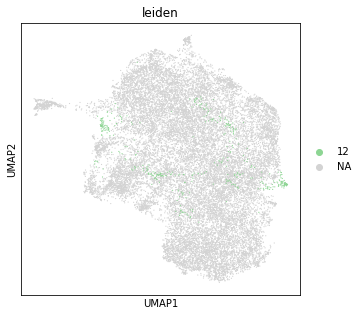

In [87]:
sc.pl.umap(macro, color=['leiden'],groups='12')

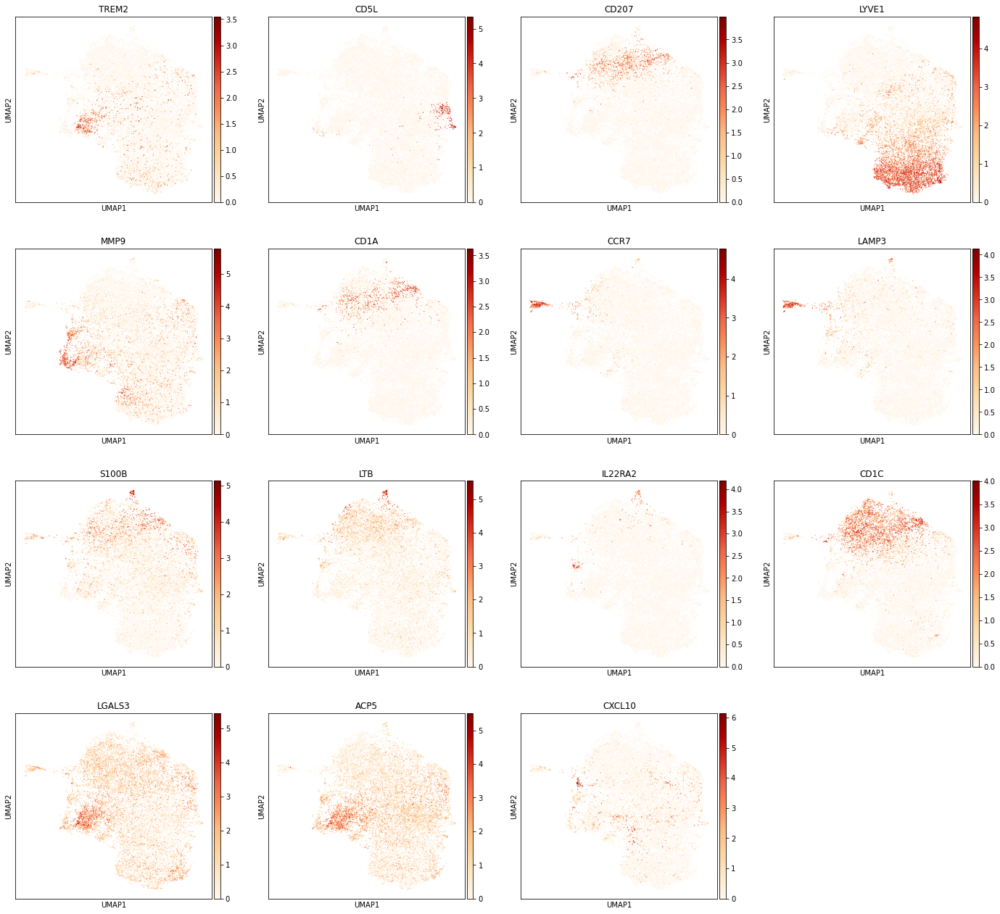

In [86]:
sc.pl.umap(macro,color=['TREM2','CD5L','CD207','LYVE1','MMP9','CD1A','CCR7','LAMP3','S100B','LTB','IL22RA2','CD1C','LGALS3','ACP5','CXCL10'],cmap='OrRd')

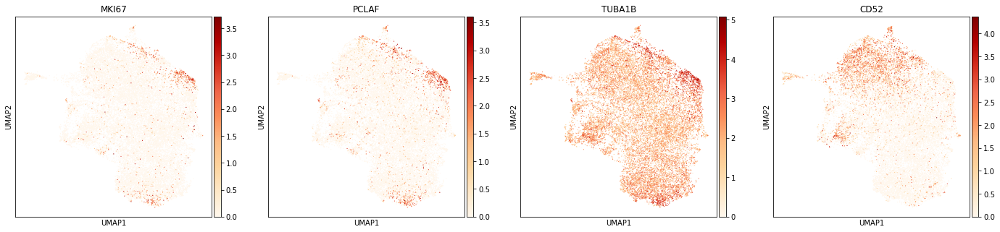

In [88]:
sc.pl.umap(macro,color=['MKI67','PCLAF','TUBA1B','CD52'],cmap='OrRd')

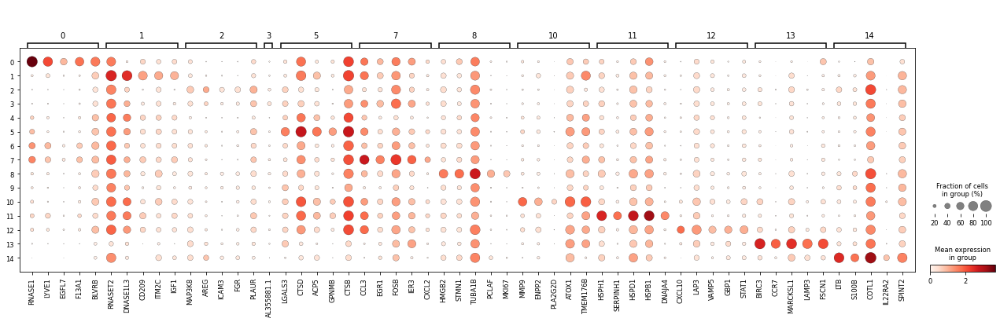

In [68]:
macro.raw = macro.copy()
mkst = calc_marker_stats(macro, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(macro, groupby='leiden', mks=mks)

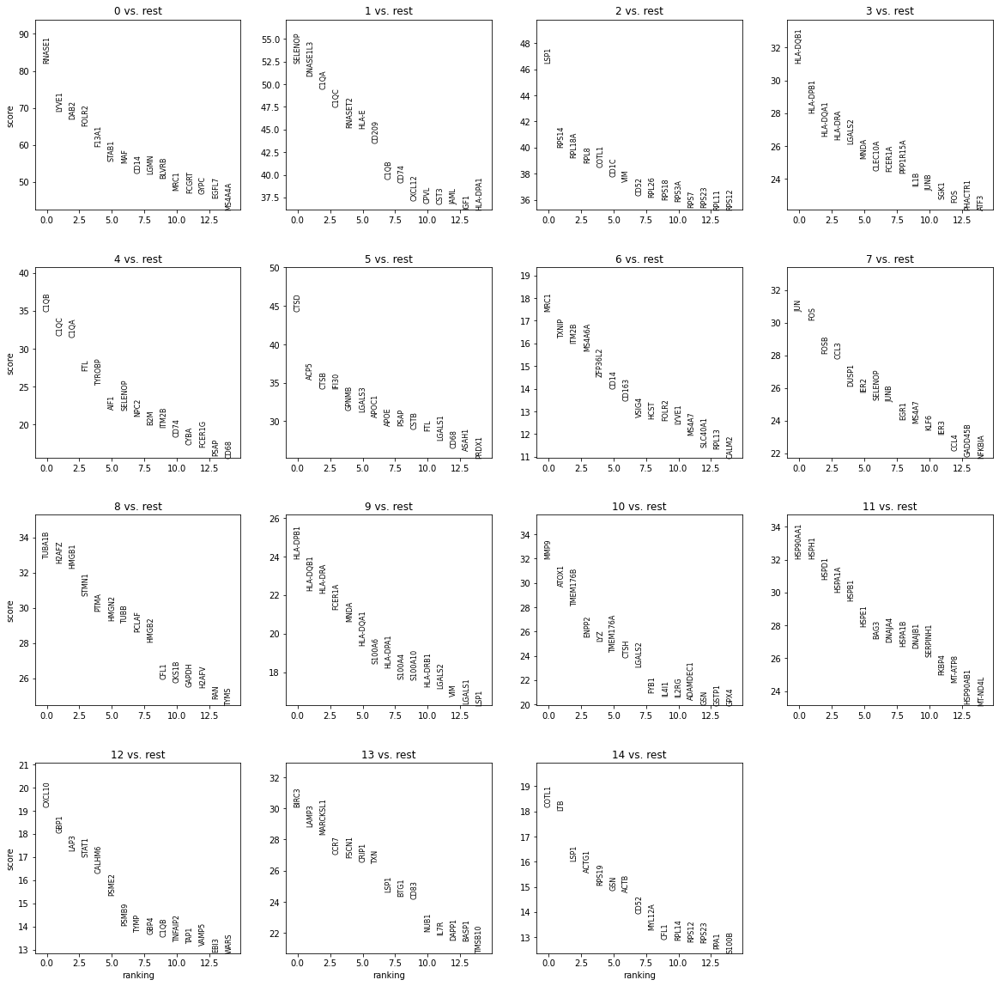

In [76]:
sc.tl.rank_genes_groups(macro, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(macro, n_genes=15, sharey=False)

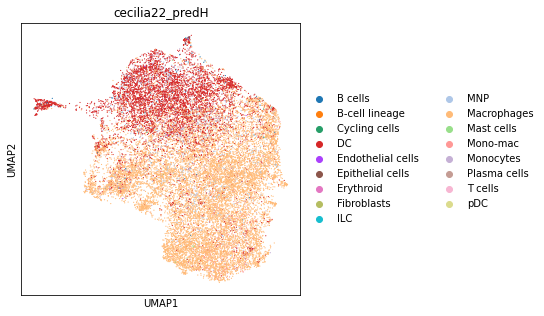

In [53]:
sc.pl.umap(macro,color='cecilia22_predH')

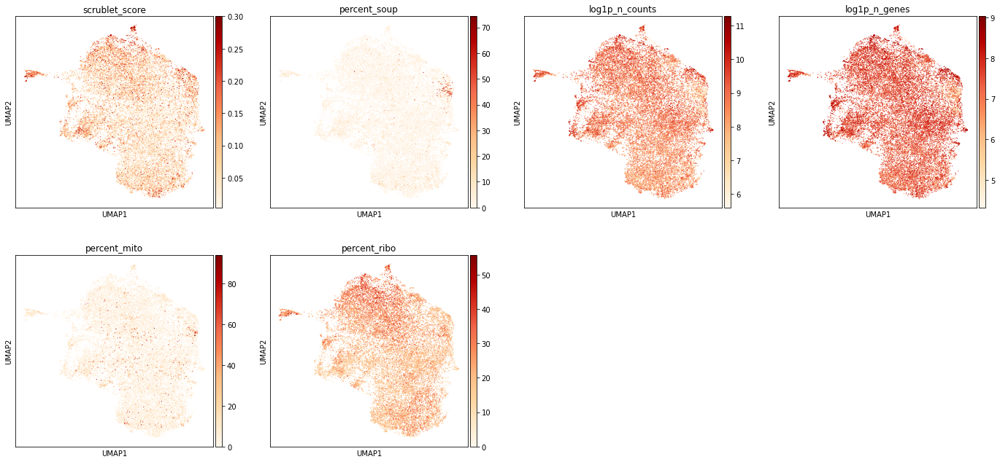

In [60]:
#plot some basic QC
sc.pl.umap(macro, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

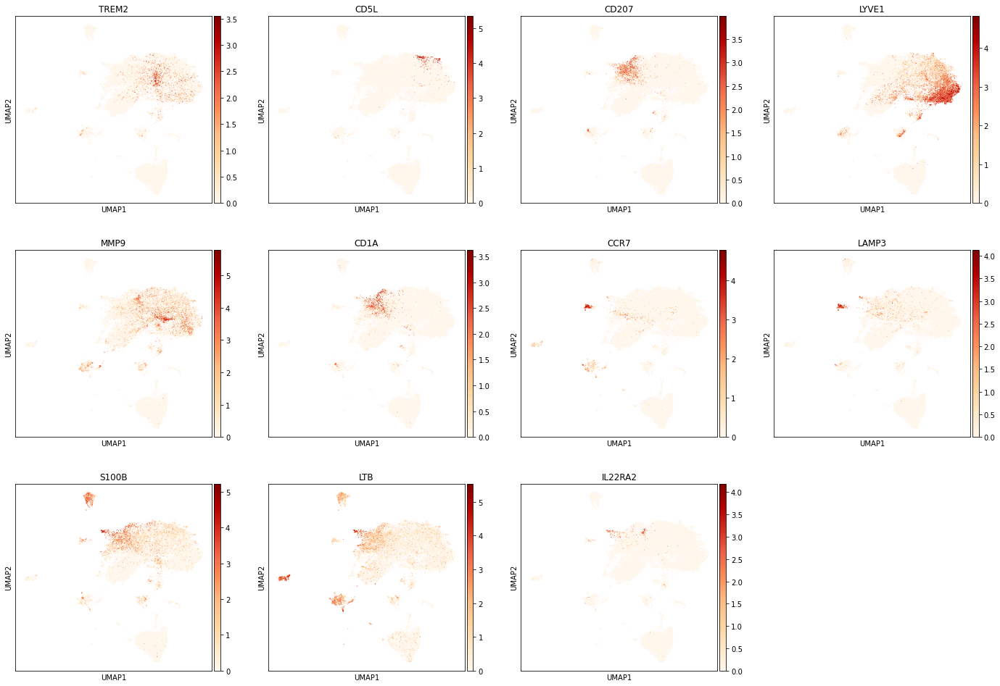

In [63]:
sc.pl.umap(adata,color=['TREM2','CD5L','CD207','LYVE1','MMP9','CD1A','CCR7','LAMP3','S100B','LTB','IL22RA2'],cmap='OrRd')

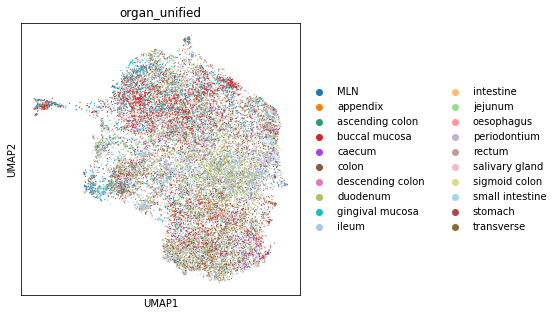

In [64]:
sc.pl.umap(macro,color='organ_unified')

In [69]:
pd.crosstab(macro.obs.annot_v3,macro.obs.leiden)

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
annot_v3,,,,,,,,,,,,,,,
DC_Langerhans_CD207,3,15,150,157,42,7,22,1,29,157,26,0,51,3,99
DC_cDC2,12,82,2256,1296,26,75,159,39,365,127,48,36,21,16,53
DC_migratory_DC,1,53,68,62,44,108,15,2,37,14,368,7,130,390,6
Macrophage,741,2482,185,797,1446,646,1033,816,424,628,130,570,104,6,6
Macrophage_CD5L,0,12,0,0,11,0,0,4,0,0,0,0,56,0,0
Macrophage_LYVE1,2533,43,1,1,66,42,159,161,19,6,6,26,4,0,0
Macrophage_MMP9,247,36,1,4,58,84,29,70,23,1,314,12,71,0,0
Macrophage_TREM2,90,8,18,1,138,549,15,1,52,2,15,15,3,2,0


In [82]:
pd.crosstab(macro.obs.cecilia22_predH,macro.obs.leiden)

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
cecilia22_predH,,,,,,,,,,,,,,,
B cells,2,1,21,10,11,12,2,2,11,4,3,1,0,15,13
B-cell lineage,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
Cycling cells,0,0,0,0,0,0,0,0,3,0,0,0,1,1,0
DC,55,116,1858,1236,132,152,281,53,374,611,240,8,93,339,107
Endothelial cells,0,0,1,1,2,1,0,0,1,0,0,0,0,0,1
Epithelial cells,0,0,2,1,0,1,1,0,1,0,0,0,0,0,0
Erythroid,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
Fibroblasts,0,0,1,1,4,0,1,0,0,0,0,1,0,0,0
ILC,0,0,0,1,0,0,0,0,2,0,0,0,0,0,11


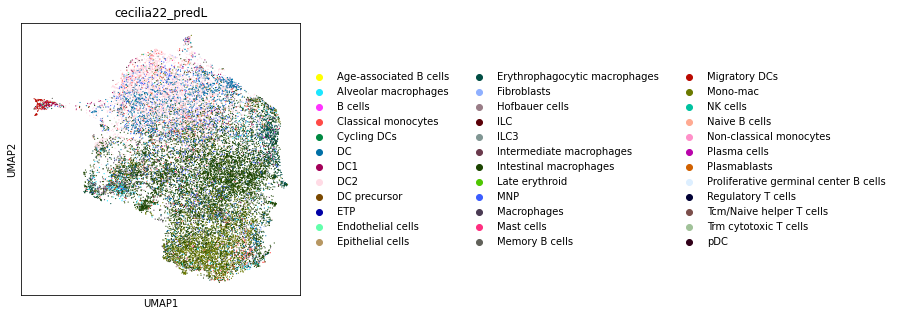

In [83]:
sc.pl.umap(macro,color='cecilia22_predL')

In [93]:
new_cluster_names = [
    'Macrophage_LYVE1','Macrophage', #0,1
    'DC_cDC2','DC_cDC2', #2,3
    'Macrophage','Macrophage_TREM2', #4,5
    'Macrophage','Macrophage', #6,7
    'Macrophage_cycling','DC_cDC2', #8,9
    'Macrophage_MMP9','Macrophage', #10,11
    'Macrophage_CD5L/CXCL10','DC_migratory', #12,13
    'DC_langerhans' #14
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

macro.obs['annot_v3'] = [conv[x] for x in macro.obs['leiden']]

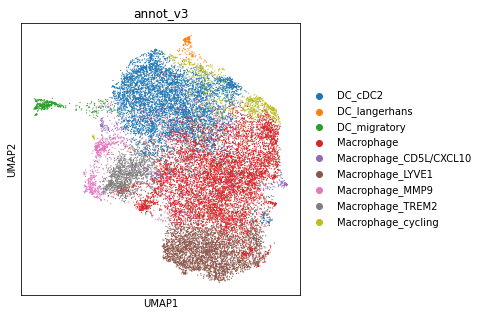

In [94]:
sc.pl.umap(macro,color='annot_v3')

In [95]:
cd5 = macro[macro.obs.annot_v3.isin(['Macrophage_CD5L/CXCL10'])].copy()

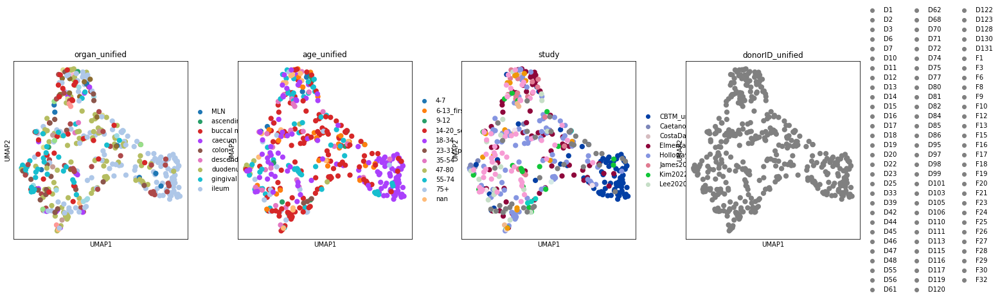

In [96]:
sc.pp.neighbors(
        cd5,
            use_rep="X_scvi",
            n_pcs=cd5.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(cd5, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(cd5, color=['organ_unified', 'age_unified','study','donorID_unified'])

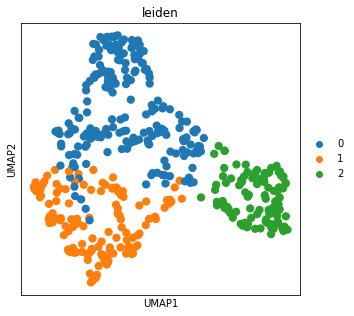

In [99]:
sc.tl.leiden(cd5, resolution = 0.3, neighbors_key="neighbors_scvi")
sc.pl.umap(cd5, color=['leiden'])

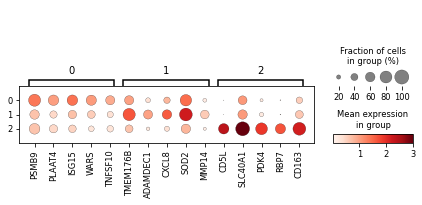

In [100]:
cd5.raw = cd5.copy()
mkst = calc_marker_stats(cd5, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(cd5, groupby='leiden', mks=mks)

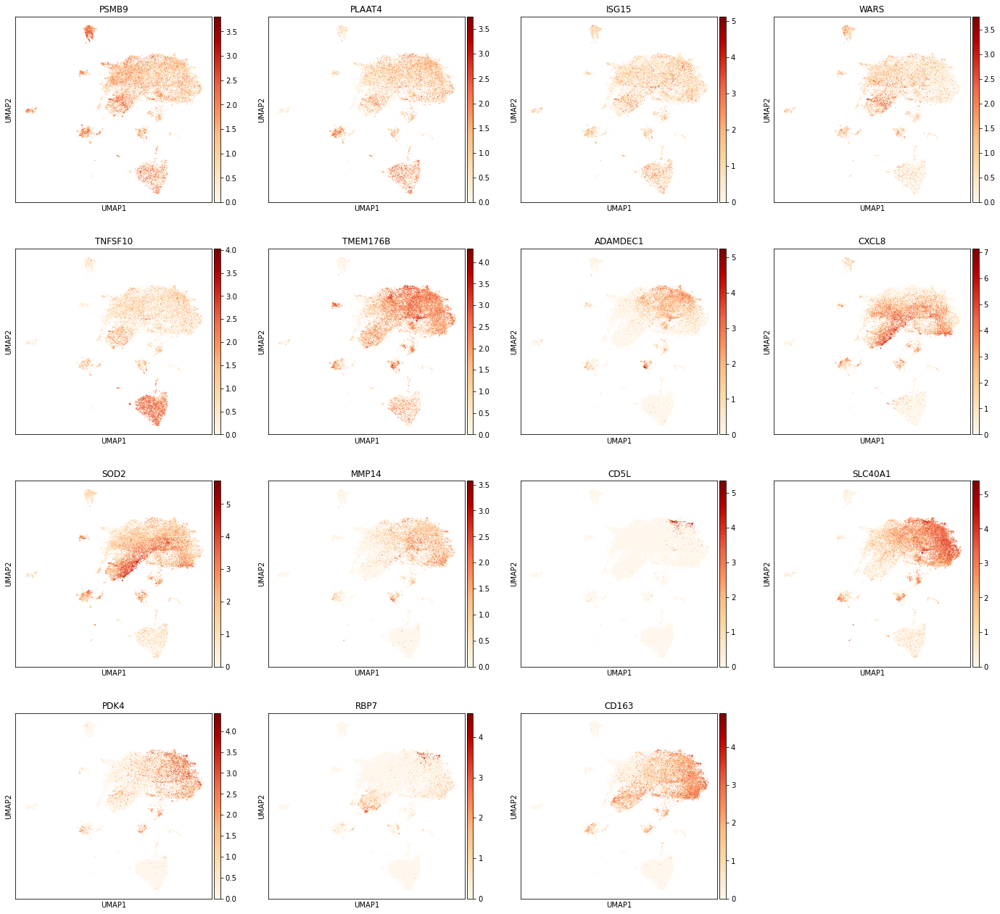

In [101]:
sc.pl.umap(adata,color=['PSMB9','PLAAT4','ISG15','WARS','TNFSF10','TMEM176B','ADAMDEC1','CXCL8','SOD2','MMP14','CD5L','SLC40A1','PDK4','RBP7','CD163'],cmap='OrRd')

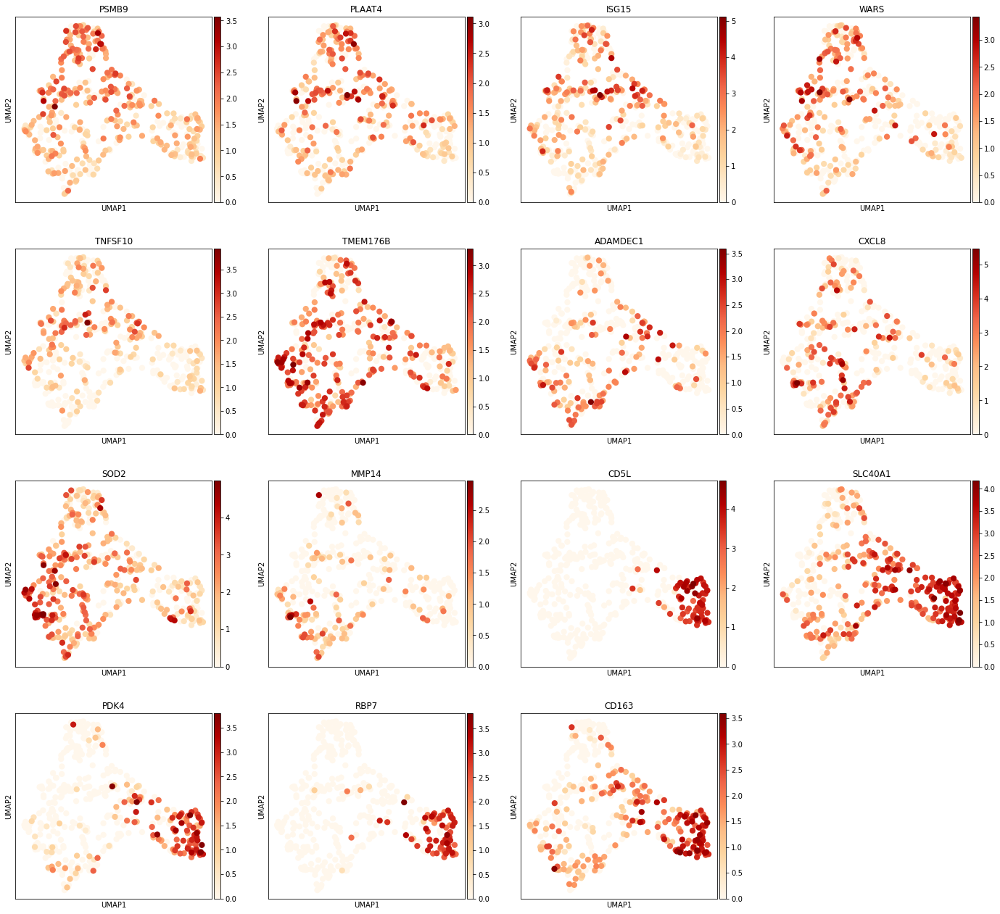

In [102]:
sc.pl.umap(cd5,color=['PSMB9','PLAAT4','ISG15','WARS','TNFSF10','TMEM176B','ADAMDEC1','CXCL8','SOD2','MMP14','CD5L','SLC40A1','PDK4','RBP7','CD163'],cmap='OrRd')

In [103]:
new_cluster_names = [
    'Macrophage','Macrophage', #0,1
    'Macrophage_CD5L', #2,3
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

cd5.obs['annot_v3'] = [conv[x] for x in cd5.obs['leiden']]

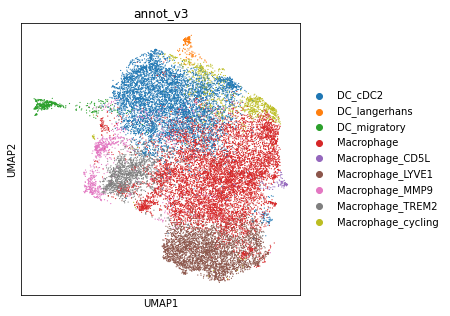

In [104]:
ON = {O:N for O,N in zip(cd5.obs_names,cd5.obs["annot_v3"])}
macro.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(macro.obs_names, macro.obs["annot_v3"])]
sc.pl.umap(macro,color='annot_v3')

In [105]:
cyc = macro[macro.obs.annot_v3.isin(['Macrophage_cycling'])].copy()

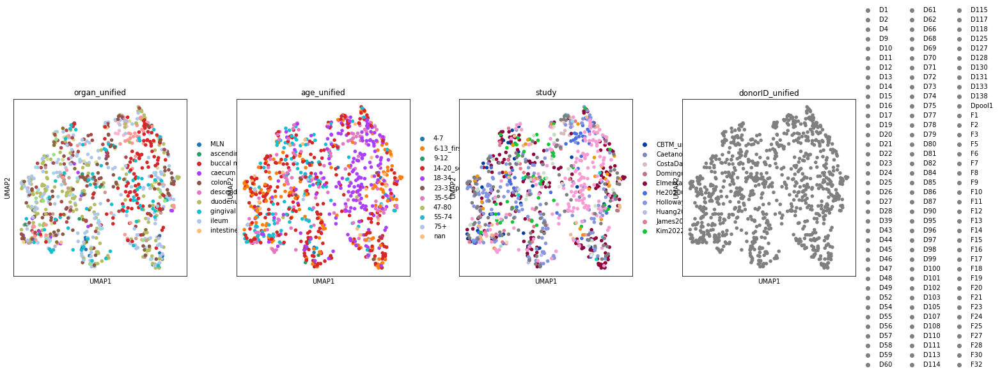

In [106]:
sc.pp.neighbors(
        cyc,
            use_rep="X_scvi",
            n_pcs=cyc.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(cyc, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(cyc, color=['organ_unified', 'age_unified','study','donorID_unified'])

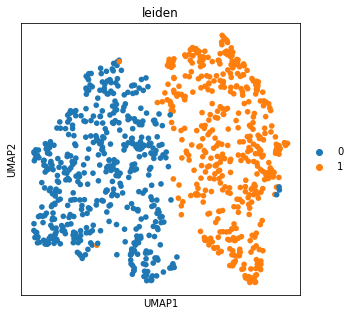

In [107]:
sc.tl.leiden(cyc, resolution = 0.3, neighbors_key="neighbors_scvi")
sc.pl.umap(cyc, color=['leiden'])

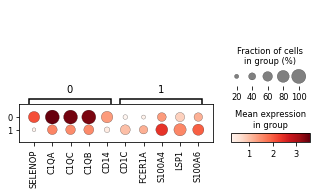

In [108]:
cyc.raw = cyc.copy()
mkst = calc_marker_stats(cyc, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(cyc, groupby='leiden', mks=mks)

In [109]:
#score cell cycle genes
cell_cycle_genes = ['MCM5',
'PCNA',
 'TYMS',
 'FEN1',
 'MCM2',
 'MCM4',
 'RRM1',
 'UNG',
 'GINS2',
 'MCM6',
 'CDCA7',
 'DTL',
 'PRIM1',
 'UHRF1',
 'MLF1IP',
 'HELLS',
 'RFC2',
 'RPA2',
 'NASP',
 'RAD51AP1',
 'GMNN',
 'WDR76',
 'SLBP',
 'CCNE2',
 'UBR7',
 'POLD3',
 'MSH2',
 'ATAD2',
 'RAD51',
 'RRM2',
 'CDC45',
 'CDC6',
 'EXO1',
 'TIPIN',
 'DSCC1',
 'BLM',
 'CASP8AP2',
 'USP1',
 'CLSPN',
 'POLA1',
 'CHAF1B',
 'BRIP1',
 'E2F8',
 'HMGB2',
 'CDK1',
 'NUSAP1',
 'UBE2C',
 'BIRC5',
 'TPX2',
 'TOP2A',
 'NDC80',
 'CKS2',
 'NUF2',
 'CKS1B',
 'MKI67',
 'TMPO',
 'CENPF',
 'TACC3',
 'FAM64A',
 'SMC4',
 'CCNB2',
 'CKAP2L',
 'CKAP2',
 'AURKB',
 'BUB1',
 'KIF11',
 'ANP32E',
 'TUBB4B',
 'GTSE1',
 'KIF20B',
 'HJURP',
 'CDCA3',
 'HN1',
 'CDC20',
 'TTK',
 'CDC25C',
 'KIF2C',
 'RANGAP1',
 'NCAPD2',
 'DLGAP5',
 'CDCA2',
 'CDCA8',
 'ECT2',
 'KIF23',
 'HMMR',
 'AURKA',
 'PSRC1',
 'ANLN',
 'LBR',
 'CKAP5',
 'CENPE',
 'CTCF',
 'NEK2',
 'G2E3',
 'GAS2L3',
 'CBX5',
 'CENPA']

In [110]:
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
adata = adata[adata.obs.G2M_score.sort_values(ascending=True).index].copy()

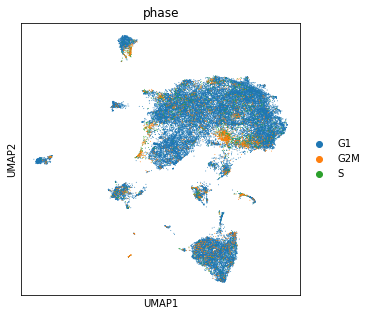

In [111]:
sc.pl.umap(adata,color='phase')

In [112]:
sc.tl.score_genes_cell_cycle(cyc, s_genes=s_genes, g2m_genes=g2m_genes)
cyc = cyc[cyc.obs.G2M_score.sort_values(ascending=True).index].copy()

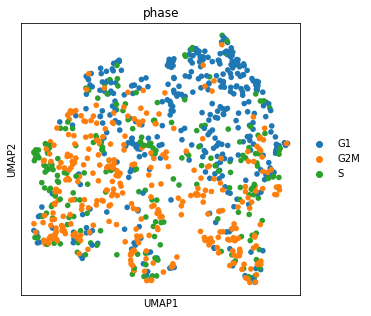

In [113]:
sc.pl.umap(cyc,color='phase')

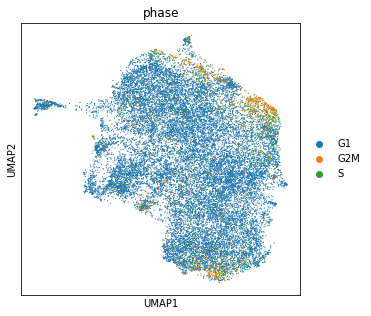

In [115]:
sc.tl.score_genes_cell_cycle(macro, s_genes=s_genes, g2m_genes=g2m_genes)
macro = macro[macro.obs.G2M_score.sort_values(ascending=True).index].copy()
sc.pl.umap(macro,color='phase')

In [121]:
new_cluster_names = [
    'Macrophage','DC_cDC2' #0,1
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

cyc.obs['annot_v3'] = [conv[x] for x in cyc.obs['leiden']]

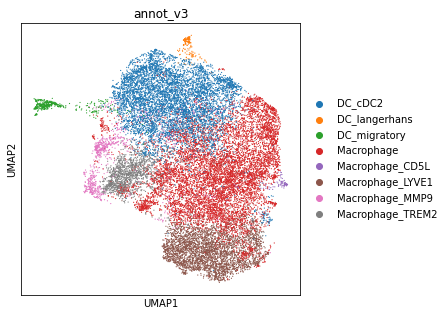

In [122]:
ON = {O:N for O,N in zip(cyc.obs_names,cyc.obs["annot_v3"])}
macro.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(macro.obs_names, macro.obs["annot_v3"])]
sc.pl.umap(macro,color='annot_v3')

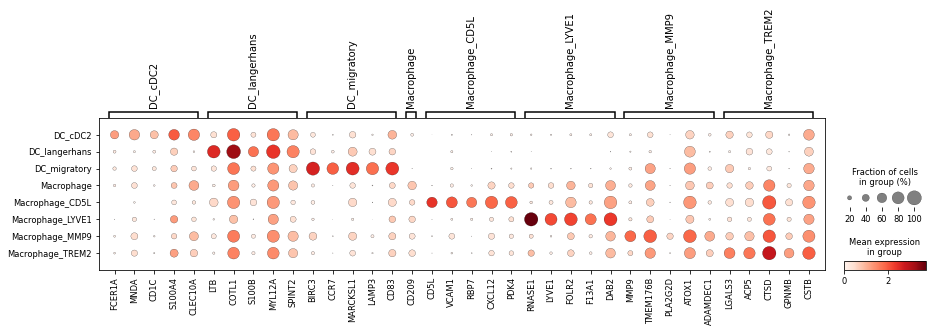

In [123]:
macro.raw = macro.copy()
mkst = calc_marker_stats(macro, groupby="annot_v3")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(macro, groupby='annot_v3', mks=mks)

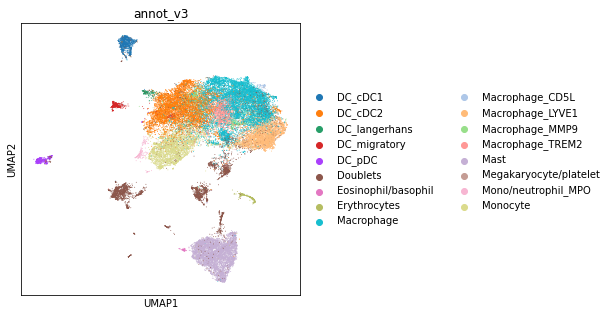

In [124]:
ON = {O:N for O,N in zip(macro.obs_names,macro.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

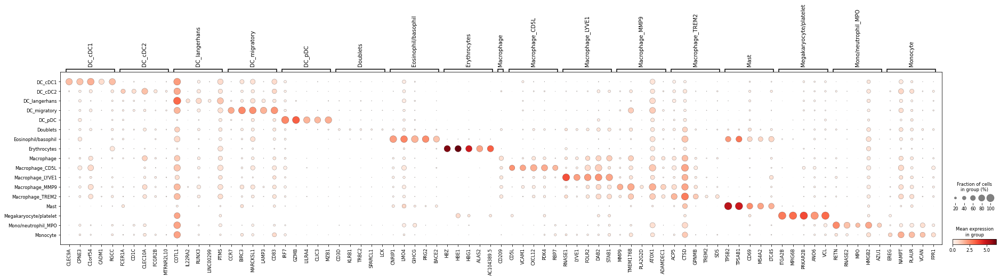

In [125]:
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="annot_v3")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='annot_v3', mks=mks)

In [127]:
pd.crosstab(adata.obs.cecilia22_predL,adata.obs.annot_v3)

annot_v3,DC_cDC1,DC_cDC2,DC_langerhans,DC_migratory,DC_pDC,Doublets,Eosinophil/basophil,Erythrocytes,Macrophage,Macrophage_CD5L,Macrophage_LYVE1,Macrophage_MMP9,Macrophage_TREM2,Mast,Megakaryocyte/platelet,Mono/neutrophil_MPO,Monocyte
cecilia22_predL,,,,,,,,,,,,,,,,,
Age-associated B cells,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0
Alveolar macrophages,6,52,3,13,0,112,0,6,135,0,95,33,104,8,0,0,60
B cells,0,0,0,0,0,2,0,0,4,0,0,0,0,0,0,0,0
CD16+ NK cells,0,0,0,0,0,27,0,0,0,0,0,0,0,0,0,0,0
CD16- NK cells,0,0,0,0,1,18,5,0,0,0,0,0,0,0,0,0,0
CRTAM+ gamma-delta T cells,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0
Classical monocytes,16,286,9,6,3,403,4,5,181,0,90,17,49,7,2,96,2044
Cycling DCs,0,0,0,1,0,2,0,0,4,0,0,0,0,0,0,0,1
Cycling T cells,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


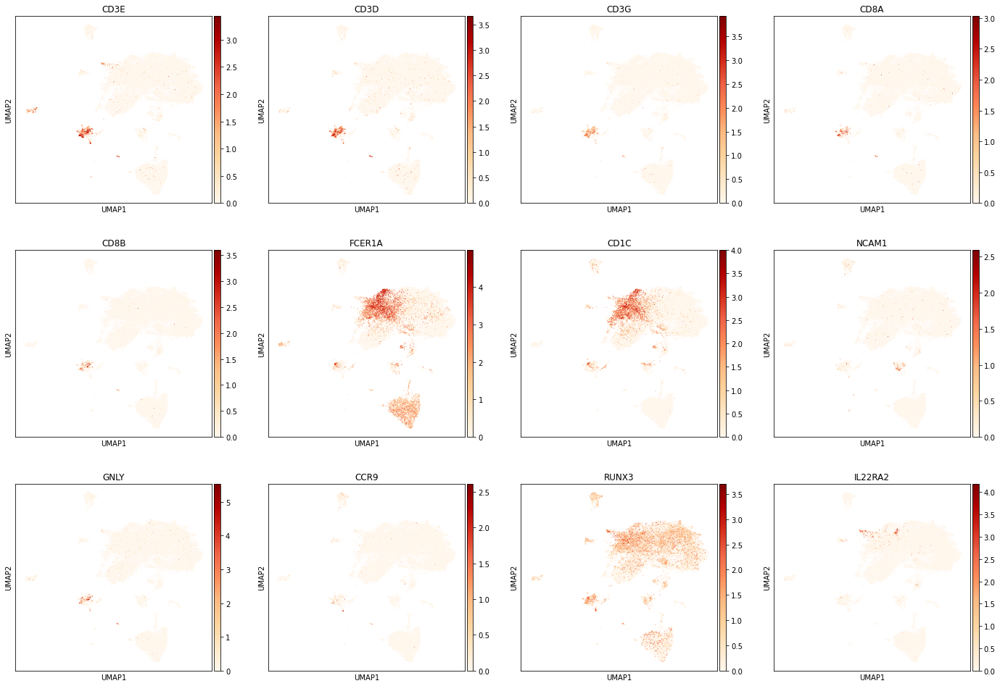

In [137]:
sc.pl.umap(adata,color=['CD3E','CD3D','CD3G','CD8A','CD8B','FCER1A','CD1C','NCAM1','GNLY','CCR9','RUNX3','IL22RA2'],cmap='OrRd')

In [138]:
adata.obs['annot_v3'] = (
    adata.obs["annot_v3"]
    .map(lambda x: {'DC_langerhans':'DC_IL22RA2'
    }.get(x, x))
    .astype("category")
)

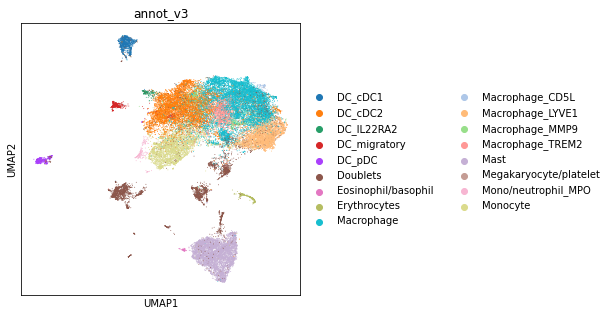

In [139]:
sc.pl.umap(adata,color='annot_v3')

In [140]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Myeloid.hvg5000_noCC.scvi_output.annotv3.22021206.h5ad')

In [141]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [142]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/Myeloid_annot_v3.csv')

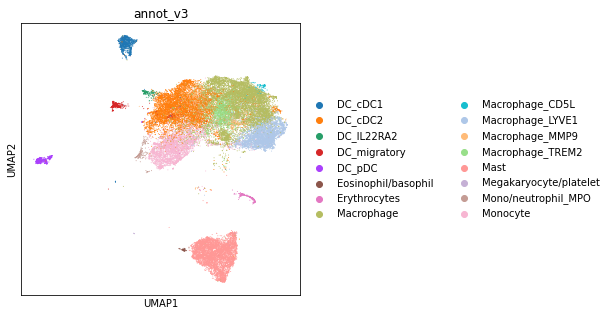

In [143]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [144]:
adata_nodoublets.X.max()

8.631204

In [145]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [146]:
adata_nodoublets.X.max()

13567.0

In [ ]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/Myeloid.raw.annotv3.nodoublets.22021206.h5ad')

### rename IL22RA DCs as langerhans DCs

In [6]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Myeloid.hvg5000_noCC.scvi_output.annotv3.22021206.h5ad')

In [7]:
adata.obs['annot_v3'] = (
    adata.obs["annot_v3"]
    .map(lambda x: {'DC_IL22RA2':'DC_langerhans'
    }.get(x, x))
    .astype("category")
)

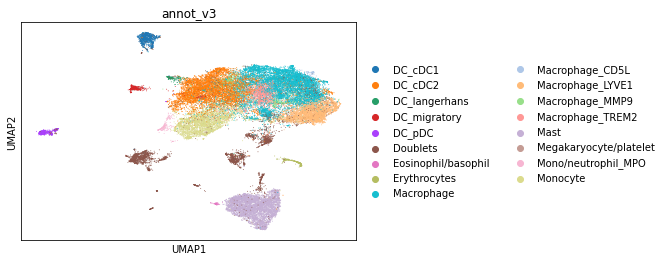

In [8]:
sc.pl.umap(adata,color='annot_v3')

In [9]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/Myeloid.hvg5000_noCC.scvi_output.annotv3.22021206.h5ad')

In [10]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [11]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/Myeloid_annot_v3.csv')

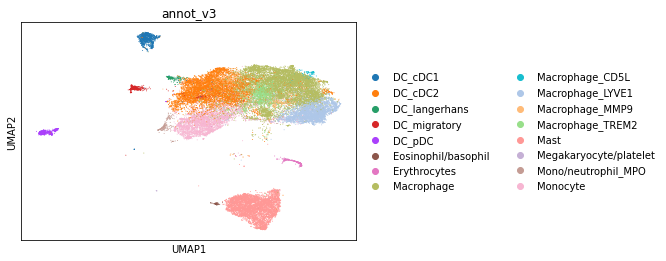

In [13]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [14]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [15]:
adata_nodoublets.X.max()

13567.0

In [16]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/Myeloid.raw.annotv3.nodoublets.22021206.h5ad')

In [2]:
adata_nodoublets = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/Myeloid.raw.annotv3.nodoublets.22021206.h5ad')

In [3]:
adata_nodoublets

AnnData object with n_obs × n_vars = 33213 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

### Marker and UMAP plots

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/no_doublets/Myeloid.hvg5000_noCC.scvi_output.annotv3.nodoublets.22021208.h5ad')

In [3]:
adata.X.max()

13567.0

In [4]:
#save raw counts in layers
adata.layers['counts'] = adata.X
#normalise and transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


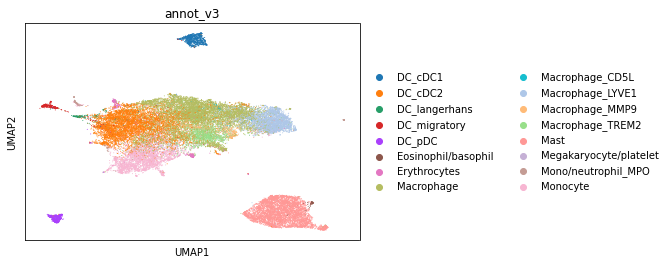

In [5]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='annot_v3')

In [6]:
adata.uns["annot_v3_colors"] = ['#8c543f',#DC_cDC1
'#a5b79d',#DC_cDC2
'#20cc8a',#DC_langerhans
'#536957',#DC_migratory
'#9e8483',#DC_pDC
'#8b4eba',#Eosinophil/basophil
'#0e539c',#Erythrocytes
'#486626',#Macrophage
'#caf9cf',#Macrophage_CD5L
'#23897d',#Macrophage_LYVE1
'#c1ed15',#Macrophage_MMP9
'#0d2823',#Macrophage_TREM2
'#564a56',#Mast
'#c730aa',#Megakaryocyte/platelet
'#070c14',#Mono/neutrophil_MPO
'#5baf07']#Monocyte




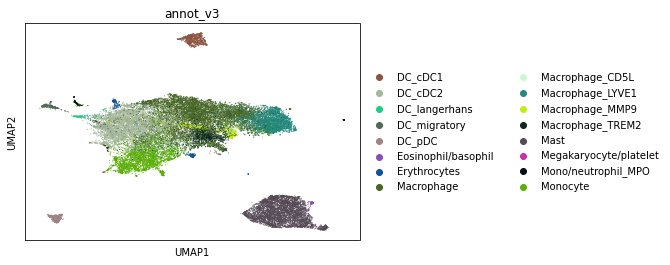

In [7]:
sc.pl.umap(adata,color='annot_v3')

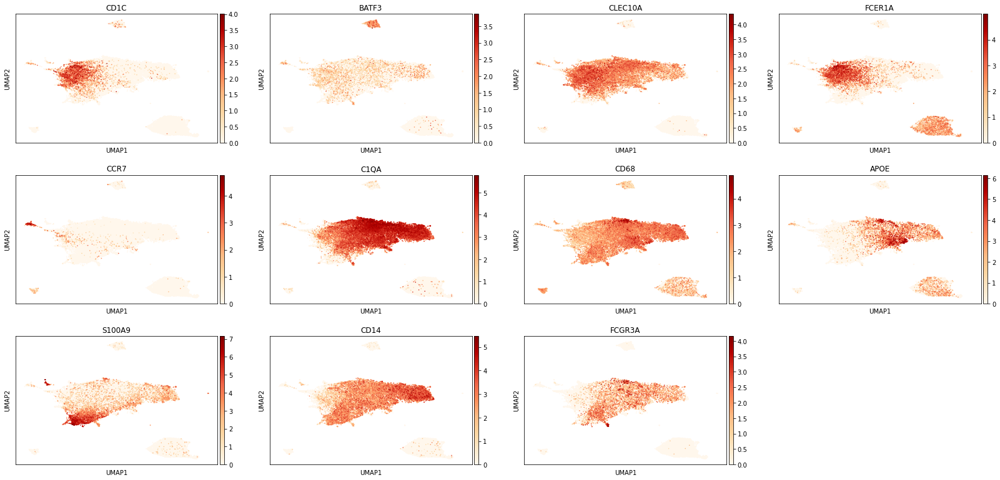

In [8]:
sc.pl.umap(adata, color=['CD1C','BATF3','CLEC10A','FCER1A','CCR7', #DC markers
                        'C1QA','CD68','APOE',#macrophage
                        'S100A9','CD14','FCGR3A' #monocyte
                        ],color_map='OrRd',size=10)

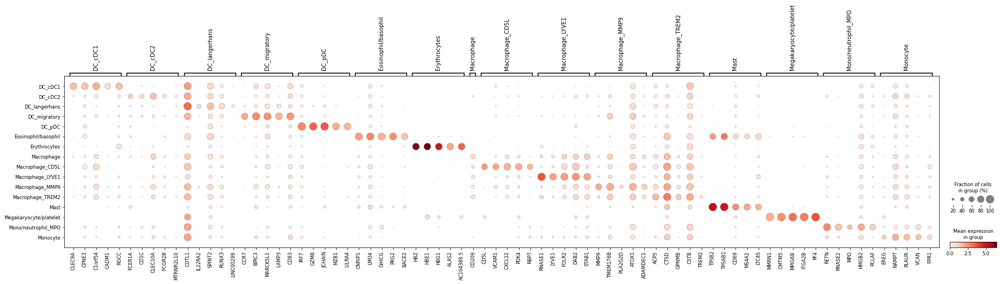

In [9]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="annot_v3")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='annot_v3', mks=mks)

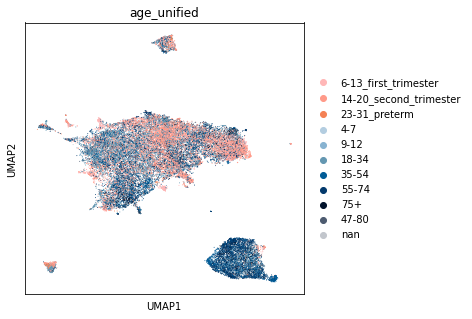

In [10]:
adata.obs['age_unified'].cat.reorder_categories(['6-13_first_trimester','14-20_second_trimester','23-31_preterm','4-7','9-12', 
       '18-34',  '35-54', '55-74', '75+', '47-80','nan'], inplace=True)
c_age_unified = ['#ffb7b7',#'6-13_first_trimester',
                 '#ff9a89',#'14-20_second_trimester',
                 '#f48154',#'23-31_preterm',
                 '#b3cde0',#'4-7',
                 '#88b3d1',#'9-12', 
                 '#6497b1',#'18-34',  
                 '#005b96',#'35-54', 
                 '#03396c',#'55-74', 
                 '#01122b',#'75+', 
                 '#4d5b70',#'47-80', 
                 '#c2c6cc',#'nan'
    

]
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata, color='age_unified',palette=c_age_unified,save='_age_Myeloid.pdf')

In [11]:
adata.obs.annot_v3.cat.categories

Index(['DC_cDC1', 'DC_cDC2', 'DC_langerhans', 'DC_migratory', 'DC_pDC',
       'Eosinophil/basophil', 'Erythrocytes', 'Macrophage', 'Macrophage_CD5L',
       'Macrophage_LYVE1', 'Macrophage_MMP9', 'Macrophage_TREM2', 'Mast',
       'Megakaryocyte/platelet', 'Mono/neutrophil_MPO', 'Monocyte'],
      dtype='object')

In [12]:
adata.obs['annot_v3'].cat.reorder_categories(['DC_cDC1', 'DC_cDC2', 
                 'DC_migratory', 'DC_pDC','DC_langerhans','Monocyte','Mono/neutrophil_MPO',
        'Macrophage', 'Macrophage_CD5L',
       'Macrophage_LYVE1', 'Macrophage_MMP9', 'Macrophage_TREM2', 'Mast','Eosinophil/basophil', 'Erythrocytes',
       'Megakaryocyte/platelet' ], inplace=True)

In [21]:
adata.uns["annot_v3_colors"] = ['#8c543f',#DC_cDC1
                                '#a5b79d',#DC_cDC2
                                '#536957',#DC_migratory
                                '#9e8483',#DC_pDC
                                '#20cc8a',#DC_langerhans
                                '#5baf07',#Monocyte
                                '#070c14',#Mono/neutrophil_MPO
                                '#486626',#Macrophage
                                '#caf9cf',#Macrophage_CD5L
                                '#23897d',#Macrophage_LYVE1
                                '#c1ed15',#Macrophage_MMP9
                                '#0d2823',#Macrophage_TREM2
                                '#564a56',#Mast
                                '#8b4eba',#Eosinophil/basophil
                                '#0e539c',#Erythrocytes
                                '#c730aa']#Megakaryocyte/platelet






In [14]:
marker_genes_dict = {'MHCII genes':['HLA-DRA','HLA-DRB1','HLA-DPA1'],
                     'cDC1':['CLEC9A','XCR1','BATF3','CADM1','RAB7B'],
                    'cDC2':['FCER1A','CD1C','CLEC10A'],
            
                    'Migratory DCs':['CCR7','LAMP3'],
                    'Plasmacytoid DCs':['IRF7','CLEC4C','GZMB','JCHAIN','LILRA4'],
                     'Langerhans cells':['ITGAX','IL22RA2','CD207','RUNX3'],
                    
                    'Monocyte':['FCN1','S100A8','S100A9','IL1B','EREG','NAMPT','PLAUR','VCAN','FPR1'],
                     'Mono/neutrophil_MPO':['MPO','RETN','RNASE2','PCLAF'],
                    'Macrophage general markers':['C1QA','C1QB','C1QC','CD68','CD163','APOE','CD209'],
                    'Macrophage_CD5L':['CD5L','VCAM1','CXCL12','PDK4','RBP7'],
                    'Macrophage_LYVE1':['LYVE1','RNASE1','FOLR2'],
                    'Macrophage_MMP9':['MMP9','PLA2G2D','ADAMDEC1'],
                    'Macrophage_TREM2':['TREM2','ACP5','CTSD','CSTB'],
                    'Mast':['CD69','KIT','TPSB2','TPSAB1'],
                     'Eosinophils/basophils':['GATA2','CNRIP1','PRG2','GIHCG'],
                    'Erythrocytes':['HBZ','HBE1','HBG1'],
                    'Megakaryocyte/platelet':['GATA1','TAL1','MMRN1','CMTM5','MPIG6B','ITGA2B','PF4']
                    
    
    
    
}

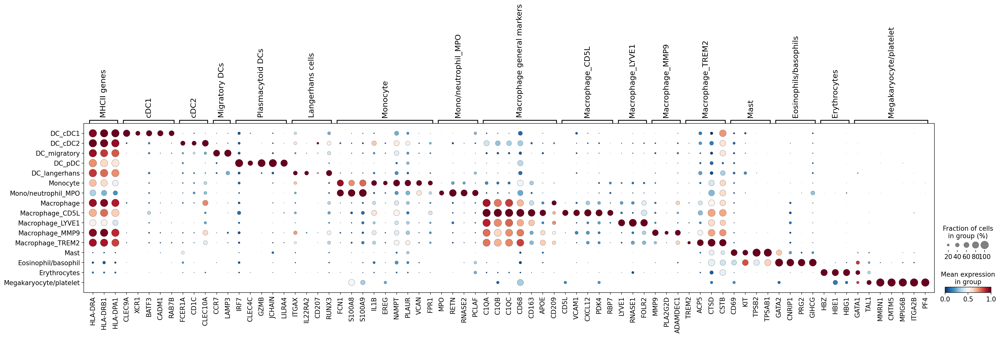

In [15]:
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='annot_v3',save='Myeloid_markers.png',color_map='RdBu_r', standard_scale='var')

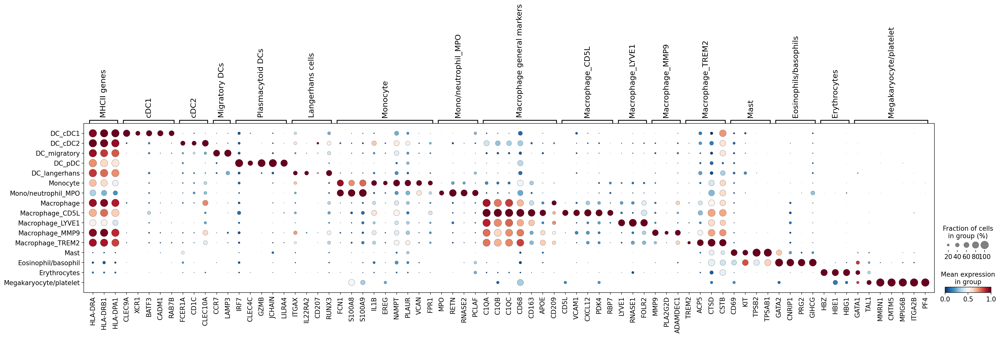

In [16]:
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='annot_v3',save='Myeloid_markers.pdf',color_map='RdBu_r', standard_scale='var')

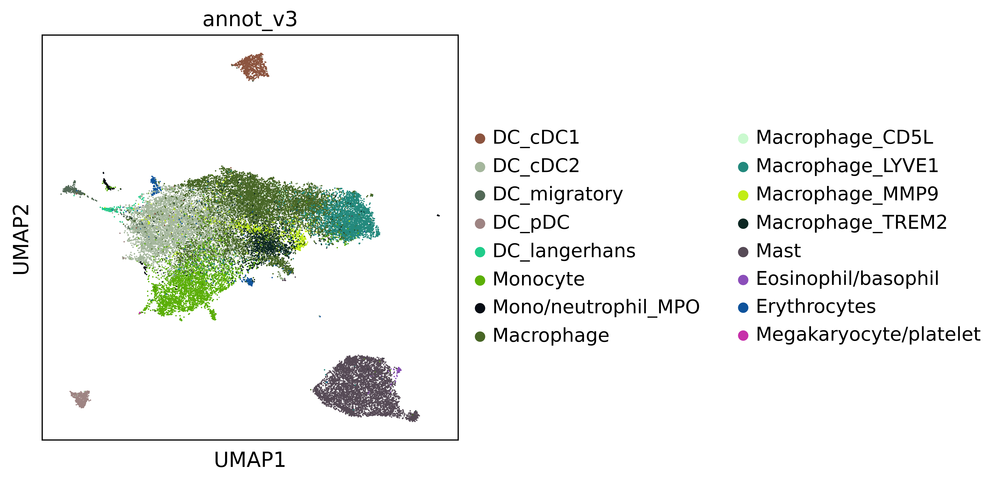

In [22]:
sc.pl.umap(adata,color='annot_v3')

In [18]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
plt.rcParams['figure.figsize'] = [5,5]
sc.set_figure_params(dpi=300,dpi_save=600)

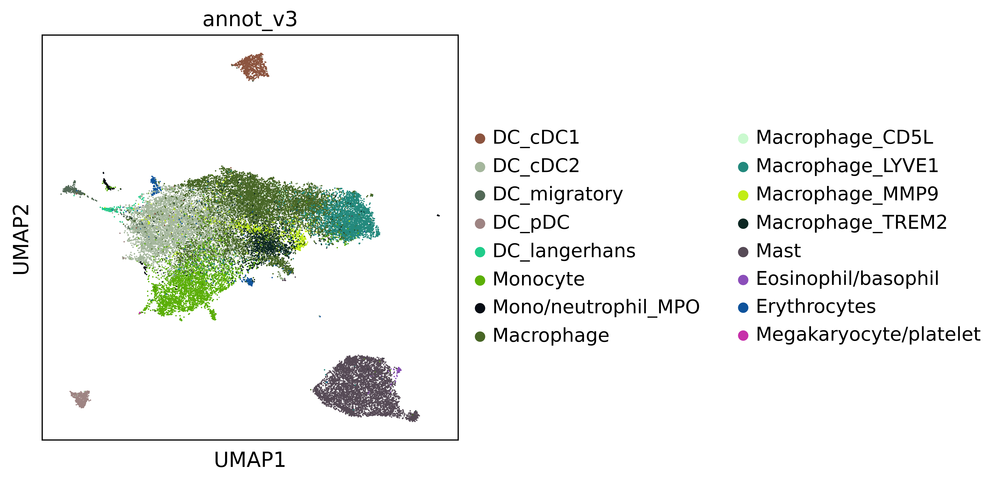

In [23]:
sc.pl.umap(adata,color='annot_v3',save='Myeloid_annot.png')

<AxesSubplot: title={'center': 'annot_v3'}, xlabel='UMAP1', ylabel='UMAP2'>

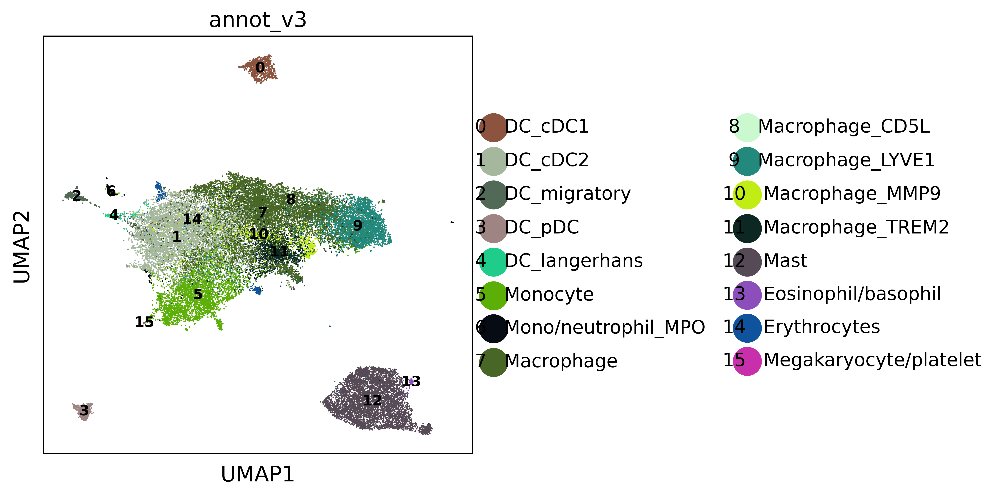

In [24]:
import sctk as sk
sk.plot_embedding(
    adata,
    basis="umap",
    groupby="annot_v3",
    figsize=(5, 5),
    save='figures/Myeloid_annot.png')